In [1]:
%pip install -U pip
%pip install -U pandas
%pip install -U matplotlib
%pip install -U seaborn
%pip install -U scikit-learn
%pip install -U numpy
%pip install -U scipy
%pip install -U dataprep

Note: you may need to restart the kernel to use updated packages.
  Using cached pandas-2.2.2-cp39-cp39-win_amd64.whl.metadata (19 kB)
Using cached pandas-2.2.2-cp39-cp39-win_amd64.whl (11.6 MB)
  Attempting uninstall: pandas
    Found existing installation: pandas 1.5.3
    Uninstalling pandas-1.5.3:
      Successfully uninstalled pandas-1.5.3
Note: you may need to restart the kernel to use updated packages.


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dataprep 0.4.5 requires pandas<2.0,>=1.1, but you have pandas 2.2.2 which is incompatible.


Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
  Using cached pandas-1.5.3-cp39-cp39-win_amd64.whl.metadata (12 kB)
Using cached pandas-1.5.3-cp39-cp39-win_amd64.whl (10.9 MB)
  Attempting uninstall: pandas
    Found existing installation: pandas 2.2.2
    Uninstalling pandas-2.2.2:
      Successfully uninstalled pandas-2.2.2
Note: you may need to restart the kernel to use updated packages.


In [2]:
import sys
assert sys.version_info >= (3, 7)

from packaging import version
import sklearn
print(sklearn.__version__)
assert version.parse(sklearn.__version__) >= version.parse("1.0.1")

import pandas as pd
import os
from datetime import datetime
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib_inline
import numpy as np
from sklearn.model_selection import train_test_split


1.4.2


In [3]:
current_directory = os.getcwd()
print("Current directory:", current_directory)

Current directory: c:\HoGent\Jaar2\ML\Project\MachineLearningProject_Solar\script


In [4]:
# Load CSV files
csv1 = pd.read_csv('https://raw.githubusercontent.com/HOGENT-ML/course/main/datasets/solar.csv')
csv2 = pd.read_csv('https://raw.githubusercontent.com/HOGENT-ML/course/main/datasets/weather.csv') 

# Load Excel file
xlsx = pd.read_excel('../data/sunrise-sunset.xlsx')


In [5]:
xlsx.to_csv('../data/sunrise-sunset.csv', index=False)


In [6]:
csv3 = pd.read_csv('../data/sunrise-sunset.csv')

In [7]:
df_solar = pd.DataFrame(csv1)
df_weather = pd.DataFrame(csv2)
df_sun = pd.DataFrame(csv3)

In [8]:
import pandas as pd

# Assuming df_solar is your DataFrame and contains the columns 'timestamp' and 'kwh'

# Convert the 'timestamp' column to string if it is not already
df_solar['timestamp'] = df_solar['timestamp'].astype(str)

# Create a new column 'last_3_chars' that contains the last 3 characters of the 'timestamp' string
df_solar['timezone'] = df_solar['timestamp'].str[-3:]

# Create a new column 'first_16_chars' that contains the first 16 characters of the 'timestamp' string
df_solar['timestamp'] = df_solar['timestamp'].str[:16]

# Display the DataFrame to check the results
print(df_solar)


             timestamp        kwh timezone
0     2023-03-11 16:00     0.5400      +01
1     2023-03-11 17:00     1.0200      +01
2     2023-03-11 18:00     1.1700      +01
3     2023-03-11 19:00     1.1800      +01
4     2023-03-11 20:00     1.1800      +01
...                ...        ...      ...
9700  2024-04-19 06:00  2417.3321      +02
9701  2024-04-19 07:00  2417.3321      +02
9702  2024-04-19 08:00  2417.3336      +02
9703  2024-04-19 09:00  2417.3701      +02
9704  2024-04-19 10:00  2417.4788      +02

[9705 rows x 3 columns]


In [9]:
def convert_date(df_solar):
  date_format = "%Y-%m-%d %H:%M:%S"
  string = str(df_solar)[:16] + ":00"
  new = datetime.strptime(string,date_format)
  return new

In [10]:
df_solar['timestamp'] = df_solar['timestamp'].apply(convert_date)

In [11]:
df_weather['timestamp'] = pd.to_datetime(df_weather['timestamp'])

In [12]:
df_sun['datum'] = pd.to_datetime(df_sun['datum'])

In [13]:
df_merged = pd.merge_asof(df_solar,df_weather,on="timestamp",direction="nearest")

In [14]:
df_merged['timestamp'] = df_merged['timestamp'].dt.strftime('%Y-%m-%d %H:%M:%S')

In [15]:
df_merged['date'] = df_merged['timestamp'].apply(lambda x: x.split(' ')[0])
print(df_merged['date'])
df_merged['time'] = df_merged['timestamp'].apply(lambda x: x.split(' ')[1])
print(df_merged['time'])

0       2023-03-11
1       2023-03-11
2       2023-03-11
3       2023-03-11
4       2023-03-11
           ...    
9700    2024-04-19
9701    2024-04-19
9702    2024-04-19
9703    2024-04-19
9704    2024-04-19
Name: date, Length: 9705, dtype: object
0       16:00:00
1       17:00:00
2       18:00:00
3       19:00:00
4       20:00:00
          ...   
9700    06:00:00
9701    07:00:00
9702    08:00:00
9703    09:00:00
9704    10:00:00
Name: time, Length: 9705, dtype: object


In [16]:
df_merged['time'] = df_merged['time'].apply(lambda x: x[:5])
print(df_merged['time'])

0       16:00
1       17:00
2       18:00
3       19:00
4       20:00
        ...  
9700    06:00
9701    07:00
9702    08:00
9703    09:00
9704    10:00
Name: time, Length: 9705, dtype: object


In [17]:
df_merged['date'] = pd.to_datetime(df_merged['date'])

In [18]:
df_merged = pd.merge(df_merged,df_sun,left_on="date",right_on="datum",how="left")

In [19]:
df_merged['kwh_per_hour'] = df_merged['kwh'].diff()


In [20]:
df_merged["timestamp"] = pd.to_datetime(df_merged["timestamp"])
df_merged["datum"] = pd.to_datetime(df_merged["datum"])
df_merged["date"] = pd.to_datetime(df_merged["date"])


In [21]:
df_merged["time"] = pd.to_datetime(df_merged["time"], format='%H:%M').dt.time


In [22]:
df_merged.drop("temp_min", axis=1, inplace=True)
df_merged.drop("temp_max", axis=1, inplace=True)
df_merged.drop("temp_grass_min", axis=1, inplace=True)
df_merged.drop("weather_current", axis=1, inplace=True)
df_merged.drop("short_wave_from_sky_24hours", axis=1, inplace=True)
df_merged.drop("sun_duration_24hours", axis=1, inplace=True)
df_merged.drop("precip_quantity", axis=1, inplace=True)
df_merged.drop("precip_range", axis=1, inplace=True)
df_merged.drop("wind_speed_unit", axis=1, inplace=True)
df_merged.drop("FID", axis=1, inplace=True)
df_merged.drop("the_geom", axis=1, inplace=True)
df_merged.drop("code", axis=1, inplace=True)
df_merged.drop("pressure_station_level", axis=1, inplace=True)
df_merged.drop("date", axis=1, inplace=True)
df_merged.drop("time", axis=1, inplace=True)
df_merged.drop("wind_direction", axis=1, inplace=True)
df_merged.drop("datum", axis=1, inplace=True)
df_merged = df_merged.dropna(subset=['wind_speed'])
df_merged = df_merged.dropna(subset=['wind_peak_speed'])


In [23]:
# drop rows where kwh is 0
df_merged = df_merged[df_merged.kwh != 0]

In [24]:
df_merged=df_merged.dropna(subset=['pressure'])

In [25]:
df_merged["cloudiness"].fillna(df_merged["cloudiness"].median(), inplace=True)

In [26]:
df_merged["humidity_relative"].fillna(df_merged["humidity_relative"].median(), inplace=True)

In [27]:
df_merged['kwh_per_hour'] = df_merged['kwh_per_hour'].fillna(0)

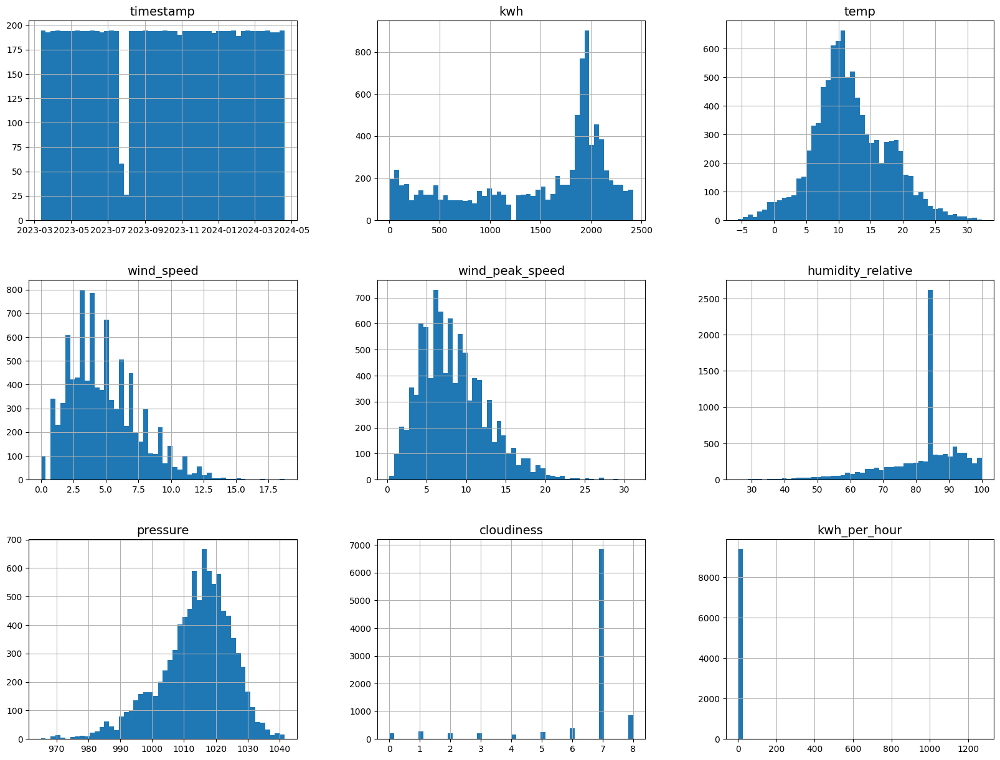

In [28]:
plt.rc('font', size=14)
plt.rc('axes', labelsize=14, titlesize=14)
plt.rc('legend', fontsize=14)
plt.rc('xtick', labelsize=10)
plt.rc('ytick', labelsize=10)

df_merged.hist(bins=50, figsize=(20,15))
plt.show()

In [29]:
corr_matrix = df_merged.corr(numeric_only=True)
corr_matrix

,kwh,temp,wind_speed,wind_peak_speed,humidity_relative,pressure,cloudiness,kwh_per_hour
kwh,1.000000,-0.190544,0.097248,0.098263,0.175518,-0.201550,0.001885,-0.008903
temp,-0.190544,1.000000,-0.051634,-0.037831,-0.450877,0.035519,-0.078140,0.024667
wind_speed,0.097248,-0.051634,1.000000,0.898099,-0.099516,-0.255053,-0.014425,-0.004371
wind_peak_speed,0.098263,-0.037831,0.898099,1.000000,-0.120093,-0.307264,0.033388,0.002784
humidity_relative,0.175518,-0.450877,-0.099516,-0.120093,1.000000,-0.121557,0.046156,-0.021438
pressure,-0.201550,0.035519,-0.255053,-0.307264,-0.121557,1.000000,-0.144966,-0.001015
cloudiness,0.001885,-0.078140,-0.014425,0.033388,0.046156,-0.144966,1.000000,-0.000596
kwh_per_hour,-0.008903,0.024667,-0.004371,0.002784,-0.021438,-0.001015,-0.000596,1.000000


array([[<Axes: xlabel='kwh', ylabel='kwh'>,
        <Axes: xlabel='cloudiness', ylabel='kwh'>,
        <Axes: xlabel='temp', ylabel='kwh'>,
        <Axes: xlabel='humidity_relative', ylabel='kwh'>,
        <Axes: xlabel='wind_speed', ylabel='kwh'>],
       [<Axes: xlabel='kwh', ylabel='cloudiness'>,
        <Axes: xlabel='cloudiness', ylabel='cloudiness'>,
        <Axes: xlabel='temp', ylabel='cloudiness'>,
        <Axes: xlabel='humidity_relative', ylabel='cloudiness'>,
        <Axes: xlabel='wind_speed', ylabel='cloudiness'>],
       [<Axes: xlabel='kwh', ylabel='temp'>,
        <Axes: xlabel='cloudiness', ylabel='temp'>,
        <Axes: xlabel='temp', ylabel='temp'>,
        <Axes: xlabel='humidity_relative', ylabel='temp'>,
        <Axes: xlabel='wind_speed', ylabel='temp'>],
       [<Axes: xlabel='kwh', ylabel='humidity_relative'>,
        <Axes: xlabel='cloudiness', ylabel='humidity_relative'>,
        <Axes: xlabel='temp', ylabel='humidity_relative'>,
        <Axes: xlabel='humid

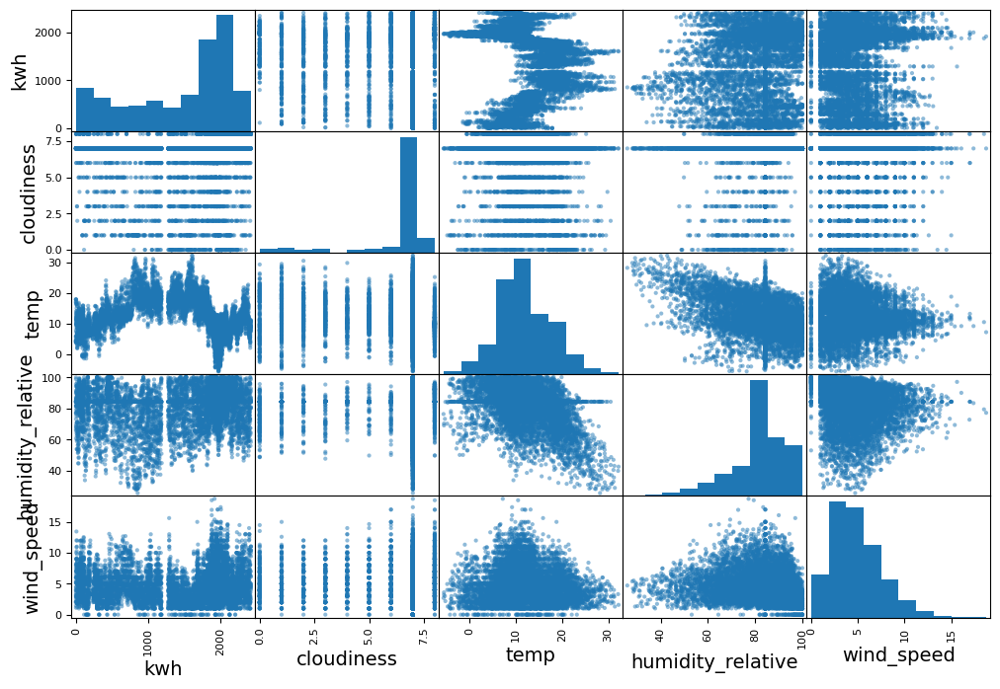

In [30]:
from pandas.plotting import scatter_matrix

attributes = ["kwh", "cloudiness", "temp",
              "humidity_relative", "wind_speed"]
scatter_matrix(df_merged[attributes], figsize=(12, 8))

In [31]:
import pandas as pd
from dataprep.eda import create_report

In [32]:
report = create_report(df_merged, title='Solar Power Report')

  0%|          | 0/1860 [00:00<?, ?it/s]

C:\Users\samde\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\dask\core.py:127: RuntimeWarning: invalid value encountered in divide
  return func(*(_execute_task(a, cache) for a in args))


Solar Power Report
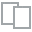
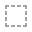
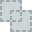
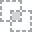
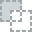
...
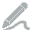
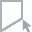
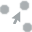
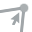
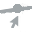

In [ ]:
report

In [ ]:
df_merged = df_merged[(df_merged['kwh_per_hour'] <= 50) & (df_merged['kwh_per_hour'] >= -20)]



In [ ]:
#correlation kwh_per_hour
corr_matrix = df_merged.corr()
corr_matrix["kwh_per_hour"].sort_values(ascending=False)

C:\Users\samde\AppData\Local\Temp\ipykernel_25876\23067388.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  corr_matrix = df_merged.corr()


kwh_per_hour         1.000000
temp                 0.318136
pressure             0.112381
wind_peak_speed      0.057754
wind_speed           0.051098
cloudiness          -0.089713
kwh                 -0.143408
humidity_relative   -0.418922
Name: kwh_per_hour, dtype: float64

In [ ]:
df_merged['Opkomst'] = pd.to_datetime(df_merged['Opkomst'], format='%H:%M:%S')


In [ ]:
df_merged["Opkomst"].head

<bound method NDFrame.head of 0      1900-01-01 07:06:00
1      1900-01-01 07:06:00
2      1900-01-01 07:06:00
3      1900-01-01 07:06:00
4      1900-01-01 07:06:00
               ...        
9700   1900-01-01 06:39:00
9701   1900-01-01 06:39:00
9702   1900-01-01 06:39:00
9703   1900-01-01 06:39:00
9704   1900-01-01 06:39:00
Name: Opkomst, Length: 9391, dtype: datetime64[ns]>

In [ ]:
#seperate date and time from opkomst
df_merged['Opkomst'] = df_merged['Opkomst'].dt.strftime('%H:%M')



Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


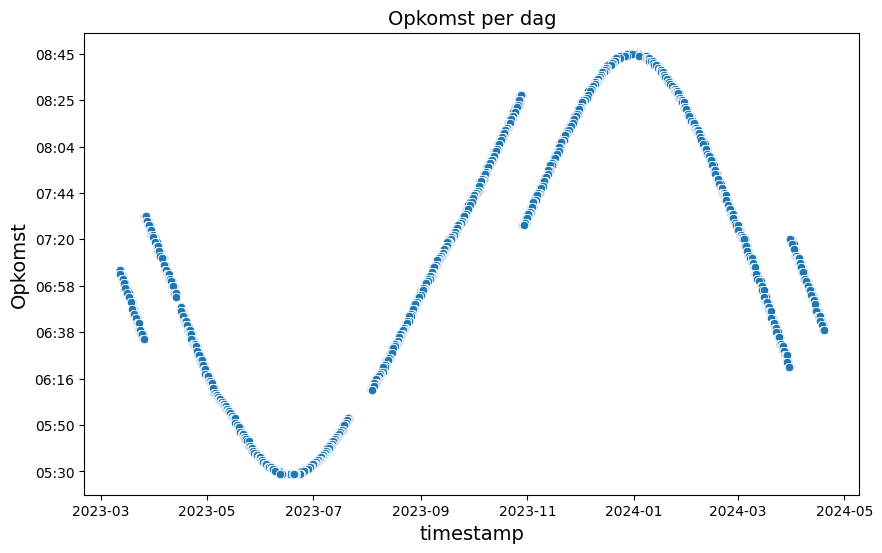

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import MaxNLocator

# Sort the DataFrame based on 'Opkomst' in descending order
df_merged_sorted = df_merged.sort_values(by='Opkomst', ascending=False)

# Create the scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='timestamp', y='Opkomst', data=df_merged_sorted)
plt.title('Opkomst per dag')

# Adjust y-axis ticker
plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))

# Show the plot
plt.show()


In [ ]:
#split timestamp into date and time
df_merged['timestamp'] = pd.to_datetime(df_merged['timestamp'])
df_merged['date'] = df_merged['timestamp'].dt.date
df_merged['time'] = df_merged['timestamp'].dt.time


NameError: name 'pd' is not defined

In [ ]:
np.random.seed(42)

In [ ]:
X = df_merged.drop(columns=["kwh_per_hour"])
y= df_merged["kwh_per_hour"]

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
len(X_train)

7512

In [ ]:
len(X_test)

1879

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error
from math import sqrt
model= RandomForestRegressor()

param_grid = [
    {'n_estimators': [100, 200, 300], 'max_depth': [None, 10, 20, 30]},
    { 'min_samples_split': [2,5, 10], 'min_samples_leaf': [1, 2, 4]},
  ]

grid_search = GridSearchCV(model, param_grid, cv=5,
                            scoring='neg_mean_squared_error',
                            return_train_score=True)

grid_search.fit(X_train, y_train)
best_model = grid_search.best_estimator_
best_model

print("best parameters:", grid_search.best_params_)


kwh_predictions = best_model.predict(X_train)
best_model_mse = mean_squared_error(y_train, kwh_predictions)
best_model_rmse = sqrt(best_model_mse)

best_model_rmse


ValueError: 
All the 105 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
105 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\samde\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\model_selection\_validation.py", line 895, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\samde\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\base.py", line 1474, in wrapper
    return fit_method(estimator, *args, **kwargs)
  File "C:\Users\samde\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\ensemble\_forest.py", line 363, in fit
    X, y = self._validate_data(
  File "C:\Users\samde\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\base.py", line 650, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "C:\Users\samde\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\utils\validation.py", line 1263, in check_X_y
    X = check_array(
  File "C:\Users\samde\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\utils\validation.py", line 997, in check_array
    array = _asarray_with_order(array, order=order, dtype=dtype, xp=xp)
  File "C:\Users\samde\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\sklearn\utils\_array_api.py", line 521, in _asarray_with_order
    array = numpy.asarray(array, order=order, dtype=dtype)
  File "C:\Users\samde\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.9_qbz5n2kfra8p0\LocalCache\local-packages\Python39\site-packages\pandas\core\generic.py", line 2070, in __array__
    return np.asarray(self._values, dtype=dtype)
TypeError: float() argument must be a string or a number, not 'Timestamp'


In [ ]:
df_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9391 entries, 0 to 9704
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   timestamp          9391 non-null   object 
 1   kwh                9391 non-null   float64
 2   timezone           9391 non-null   object 
 3   temp               9391 non-null   float64
 4   wind_speed         9391 non-null   float64
 5   wind_peak_speed    9391 non-null   float64
 6   humidity_relative  9391 non-null   float64
 7   pressure           9391 non-null   float64
 8   cloudiness         9391 non-null   float64
 9   Opkomst            9391 non-null   object 
 10  Op ware middag     9391 non-null   object 
 11  Ondergang          9391 non-null   object 
 12  kwh_per_hour       9391 non-null   float64
dtypes: float64(8), object(5)
memory usage: 1.0+ MB


In [ ]:
df_merged.head()

,timestamp,kwh,timezone,temp,wind_speed,wind_peak_speed,humidity_relative,pressure,cloudiness,Opkomst,Op ware middag,Ondergang,kwh_per_hour
0,2023-03-11 16:00:00,0.54,+01,5.8,2.000,4.0,84.3,1011.5,7.0,07:06,12:53:00,18:40:00,0.00
1,2023-03-11 17:00:00,1.02,+01,6.1,1.110,2.7,60.7,1011.7,7.0,07:06,12:53:00,18:40:00,0.48
2,2023-03-11 18:00:00,1.17,+01,5.4,3.144,4.6,65.7,1011.9,7.0,07:06,12:53:00,18:40:00,0.15
3,2023-03-11 19:00:00,1.18,+01,3.7,1.442,1.9,73.2,1012.2,7.0,07:06,12:53:00,18:40:00,0.01
4,2023-03-11 20:00:00,1.18,+01,4.1,2.000,4.0,84.3,1011.4,7.0,07:06,12:53:00,18:40:00,0.00
